<b>
<p>
<center>
<font size='6'>
Final Project
</font>
</center>
</p>

<p>
<center>
<font size='5'>
Classification of Breast Histopathology Images using Convolutional Neural Networks (CNN)</font>
</center>
</p>


<p>
<center>
<font size='3'>
Data Science, Columbian College of Arts & Sciences, George Washington University
</font>
</center>
</p>

<p>
<center>
<font size='3'>
Nina Ebensperger,  Muhannad Alwhebie, Nammin Woo
</font>
</center>
</p>
</b>


**[This is the Recording link of our presentation](https://www.youtube.com/watch?v=48o5e5mhKgM)**

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc">
  <ul class="toc-item">
    <li>
      <span>
        <a href="#Introduction" data-toc-modified-id="Introduction-1">
          <span class="toc-item-num" style="font-size: 20px;">Ⅰ&nbsp;&nbsp;</span>
          Introduction
        </a>
      </span>
    </li>
    <li>
      <span>
        <a href="#Experiment" data-toc-modified-id="Experiment-2">
          <span class="toc-item-num" style="font-size: 20px;">Ⅱ&nbsp;&nbsp;</span>
          Experiment
        </a>
      </span>
      <ul class="toc-item">
        <li>
          <span>
            <a href="#Data preprocessing" data-toc-modified-id="Data preprocessing">
              <span class="toc-item-num">1&nbsp;&nbsp;</span>
              Data preprocessing
            </a>
          </span>
        </li>
        <li>
          <span>
            <a href="#Section1" data-toc-modified-id="Section1">
              <span class="toc-item-num">2&nbsp;&nbsp;</span>
              Section 1 Resnet50
            </a>
          </span>
        </li>
        <li>
          <span>
            <a href="#Section2" data-toc-modified-id="Section2">
              <span class="toc-item-num">3&nbsp;&nbsp;</span>
              Section 2 EfficientNetB7 and VGG16
            </a>
          </span>
        </li>
      </ul>
    </li>
    <li>
      <span>
        <a href="#Conclusions" data-toc-modified-id="Conclusions-3">
          <span class="toc-item-num" style="font-size: 20px;">Ⅲ&nbsp;&nbsp;</span>
          Conclusions
        </a>






*Code color*
- ![#6EB800](https://via.placeholder.com/15/6EB800/000000?text=+) `#Folded code`

# Ⅰ. Introduction

Breast cancer is one of the leading causes of death among women worldwide. Early and accurate detection plays a vital role in improving patient outcomes and survival rates. Histopathology, the microscopic examination of breast tissue samples, is a fundamental diagnostic tool for identifying and classifying breast cancer. However, the manual analysis of histopathology images is a labor-intensive and time-consuming task prone to human error.

In recent years, advancements in machine learning and deep learning techniques have shown promising results in automating the analysis of histopathology images. Convolutional Neural Networks (CNNs), a type of deep learning algorithm specifically designed for image analysis, have demonstrated remarkable success in various computer vision tasks. Leveraging CNNs for the automated classification of breast histopathology images holds immense potential for improving diagnostic accuracy, reducing subjectivity, and enhancing the efficiency of cancer detection.

In this project, the focus is on developing a robust CNN model for the classification of breast histopathology images using the dataset sourced from Kaggle's "Breast Histopathology Images" collection. By training a CNN on this dataset, the goal is to create a reliable system capable of distinguishing between benign and malignant breast tissue samples.

Specifically, the 162 whole-mount slide images of Breast Cancer (BCa) specimens scanned at 40x, sourced from the Cancer Genome Atlas (TCGA), Invasive Ductal Carcinoma (IDC), is used for training and test the suggested model.  

Through this endeavor, the aim is to contribute to the field of medical image analysis by developing a powerful CNN model that can assist pathologists in making accurate and efficient diagnoses. By automating the classification process, the project aims to provide valuable support to medical professionals, ultimately improving patient outcomes and advancing the fight against breast cancer.

[*This topic was origined from Kaggle](https://www.kaggle.com/datasets/paultimothymooney/breast-histopathology-images)



#### <font color='#6EB800'> *Notebook configuration (Code folded)*</font>

In [ ]:
#Google drive
from google.colab import drive
import sys

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

#Warning
import warnings

# Ignore warnings
warnings.filterwarnings('ignore')

In [ ]:
#Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Set matplotlib sizes
plt.rc('font', size=20)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('legend', fontsize=20)
plt.rc('figure', titlesize=20)

In [ ]:
# TensorFlow: The magic below allows us to use tensorflow version 2.x
%tensorflow_version 2.x
import tensorflow as tf
from tensorflow import keras

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
#Random seed
random_seed = 42

# Set random seed in tensorflow
tf.random.set_seed(random_seed)

# Set random seed in numpy
import numpy as np
np.random.seed(random_seed)

# Ⅱ. Experiment

#### <font color='#6EB800'> *Import basic packages (Code folded)*</font>


In [ ]:
import numpy as np
import pandas as pd
import os
import copy
from glob import glob
import seaborn as sns
import cv2
import random
from os import listdir
from sklearn.metrics import classification_report

from skimage.io import imread

import sklearn
from sklearn import model_selection
from sklearn.model_selection import train_test_split, KFold, cross_val_score, StratifiedKFold, learning_curve, GridSearchCV
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, make_scorer, accuracy_score

import time
import copy
from tqdm import tqdm_notebook as tqdm

import keras
#import keras.utils as image
from PIL import Image
from keras import backend as K
from keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from keras.models import Sequential, model_from_json, load_model
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization, Conv2D, MaxPool2D, MaxPooling2D

## 1. Data Preprocessing


> [Data download- Web](https://www.kaggle.com/datasets/paultimothymooney/breast-histopathology-images)

> [Data download- API](https://www.kaggle.com/datasets/paultimothymooney/breast-histopathology-images)

#### <font color='#6EB800'> *Import raw data (using Kaggle API,Code folded)*</font>

In [ ]:
'''
1. kaggle account -> Create New API Token (downlaod kaggle.json)
2. Run this code[7] and upload downloaded jason file
3. Make folder and move jason file
'''
#!pip install kaggle
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"muh172","key":"e053c5292f02ad6ae64c30ffe7b57b33"}'}

In [ ]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json  #set permission for the json (readable and writable only by the owner)

rm: cannot remove '/root/.kaggle': No such file or directory


In [ ]:
'''
Download data from kaggle API
1. kaggle dataset url (API commend was coppied from kaggle webpage)
2. Unzip downloaded dataset
'''
# !kaggle datasets download -d paultimothymooney/breast-histopathology-images #Download fullset
# !unzip -q /content/breast-histopathology-images.zip

!kaggle datasets download -d paultimothymooney/breast-histopathology-images #Download fullset
!unzip -q /content/breast-histopathology-images.zip

100% 3.10G/3.10G [02:40<00:00, 25.4MB/s]
100% 3.10G/3.10G [02:40<00:00, 20.7MB/s]


In [ ]:
'''
Verify downloaded dataset
1. Entire data
2. Image data (will use for training model)
'''

#1. Entire data
import os
os.chdir('/content')
files = os.listdir()
print(files)

# #2. Image data
# os.chdir('/content/IDC_regular_ps50_idx5')  #Move to the input data folder
# files = os.listdir()
# print(files)

# #3. Number of images (Unit: 50x50 pixel)
# len(files)

['.config', '16085', '9125', '10285', '14188', '12869', '13666', '13691', '10276', '9225', '12906', '15472', '13024', '13018', '9259', '10293', '13692', '12911', '16532', '14155', '10254', '13462', '12954', '12935', '14213', '12870', '10286', '8956', '10307', '13459', '12895', '16550', '12877', '12868', '10279', '12891', '13022', '13023', '14156', '9260', '12867', '14082', '9043', '12955', '12880', '12820', '14211', '12878', '9322', '12901', '15839', '12750', '10277', '9250', '10255', '13402', '12951', '14081', '13404', '12879', '9381', '10257', '9181', '15510', '8865', '9346', '9255', '9124', '13617', '14153', '14078', '12949', '16896', '8867', '9076', '9073', '12821', '16533', '9383', '13693', '9083', '13687', '12871', '12819', '12933', '9078', '14304', '12748', '14154', '12822', '10272', '12894', '10299', '12751', '15633', '8918', '14191', '10304', '15902', '12884', '13106', '10292', '9227', '13021', '10300', '10262', '10301', '13616', '13613', '15512', '15515', '10288', '9037', '16

In [ ]:
#Check individual files
for dirname, _, filenames in os.walk('/content/IDC_regular_ps50_idx5'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Streaming output truncated to the last 5000 lines.
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x951_y1501_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2651_y1151_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2551_y1051_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x1901_y1201_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x1201_y751_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x1101_y1701_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2251_y1501_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2201_y1851_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2151_y2251_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2251_y1051_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x1801_y1151_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2651_y1901_class1.png
/content/IDC_regular_ps50_idx5/10273/1/10273_idx5_x2051_y2201_class1.png
/c

In [ ]:
#ReCheck total imalges
base_path = "/content/IDC_regular_ps50_idx5/"
folder = listdir(base_path)
len(folder)
total_images = 0
for n in range(len(folder)):
    patient_id = folder[n]
    for c in [0, 1]:
        patient_path = base_path + patient_id
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        total_images += len(subfiles)
print(total_images)

277524


### <u> Summary of Raw data  </u>

1. Number of unique patients: 279
2. Number of unit images(patched by 50x50): 277,524
3. Target label (Binary)
 - 0: IDC Negative (Not cancerous)
 - 1: IDC Positive (Cancerous)

4. Description of unit image (ex.10253_idx5_x1351_y1101_class0)
 - format: u_xX_yY_classC.png

    u: the patient ID (10253_idx5),
    X/Y: the x-coordinate/y-coordinate of where this patch was cropped from
    C: the target class(0 or 1)

In [ ]:
# Get the absolute path of the current folder
abspath_curr = '/content/drive/My Drive/Colab Notebooks/'

# Get the absolute path of the deep utilities folder
abspath_util_deep = '/content/drive/My Drive/Colab Notebooks/Functions/'

#import os
#os.getcwd()

### Transform rawdata (make a dataframe)
> patient_id, path, target



In [ ]:
os.getcwd()

'/content'

In [ ]:
# Generating into dataframe
data = pd.DataFrame(index=np.arange(0, total_images), columns=["patient_id", "path", "target"])

k = 0
for n in range(len(folder)):
    patient_id = folder[n]
    patient_path = base_path + patient_id
    for c in [0,1]:
        class_path = patient_path + "/" + str(c) + "/"
        subfiles = listdir(class_path)
        for m in range(len(subfiles)):
            image_path = subfiles[m]
            data.iloc[k]["path"] = class_path + image_path
            data.iloc[k]["target"] = c
            data.iloc[k]["patient_id"] = patient_id
            k += 1


In [ ]:
# Change working directory to the absolute path of the deep utilities folder
%cd $abspath_util_deep

# Import the deep utitilities
%run (Functions)pmlm_utilities_deep.ipynb

/content/drive/My Drive/Colab Notebooks/Functions


In [ ]:
# Print the dimension of df
pd.DataFrame([[data.shape[0], data.shape[1]]], columns=['# rows', '# columns'])

,# rows,# columns
0,277524,3


In [ ]:
# Checking Basic information of the dataframe
data.head(5)

,patient_id,path,target
0,16085,/content/IDC_regular_ps50_idx5/16085/0/16085_i...,0
1,16085,/content/IDC_regular_ps50_idx5/16085/0/16085_i...,0
2,16085,/content/IDC_regular_ps50_idx5/16085/0/16085_i...,0
3,16085,/content/IDC_regular_ps50_idx5/16085/0/16085_i...,0
4,16085,/content/IDC_regular_ps50_idx5/16085/0/16085_i...,0


In [ ]:
pd.DataFrame([[len(data['patient_id'].unique()), (data['target'].value_counts()[1]/data.shape[0]*100)]], columns=['# patients', '% of cancer image'])

,# patients,% of cancer image
0,279,28.388896


In [ ]:
data['target'].value_counts()

0    198738
1     78786
Name: target, dtype: int64

### Exploratory Data Analysis

> Identifying missing values

> Examine sample unit images(50x50 pixcels) and patient's images (merged)




In [ ]:
#Identifying missing values
nan_checker(data)

,var,proportion,dtype


#### Examine unit images (50 samples): ① Non-Cancer

In [ ]:
#50 randomly selected samples per target label (1: cancerous and 0: non-cancerous)
data.target = data.target.astype(np.int)
pos_selection = np.random.choice(data[data.target==1].index.values, size=50, replace=False)
neg_selection = np.random.choice(data[data.target==0].index.values, size=50, replace=False)

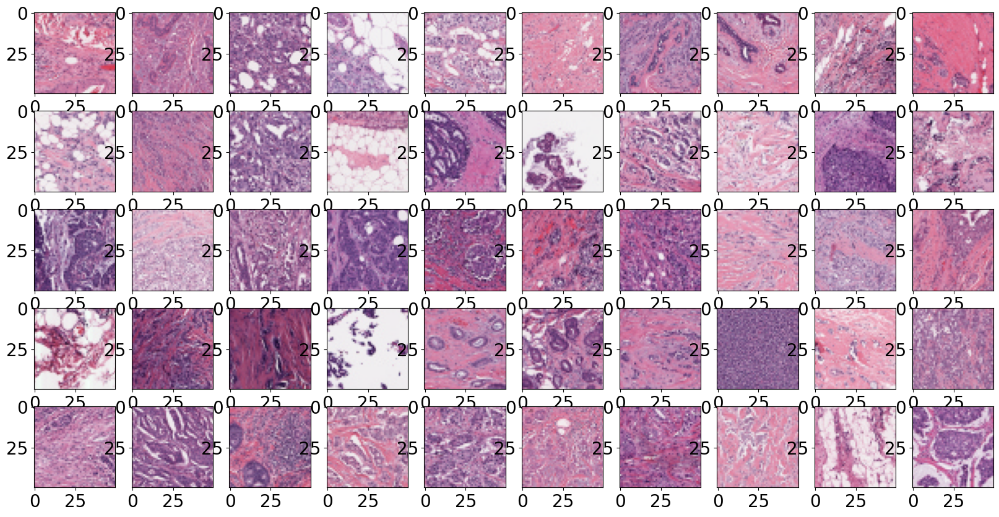

In [ ]:
#Cancer Patches
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

#### Examine unit images (50 samples): ② Cancer

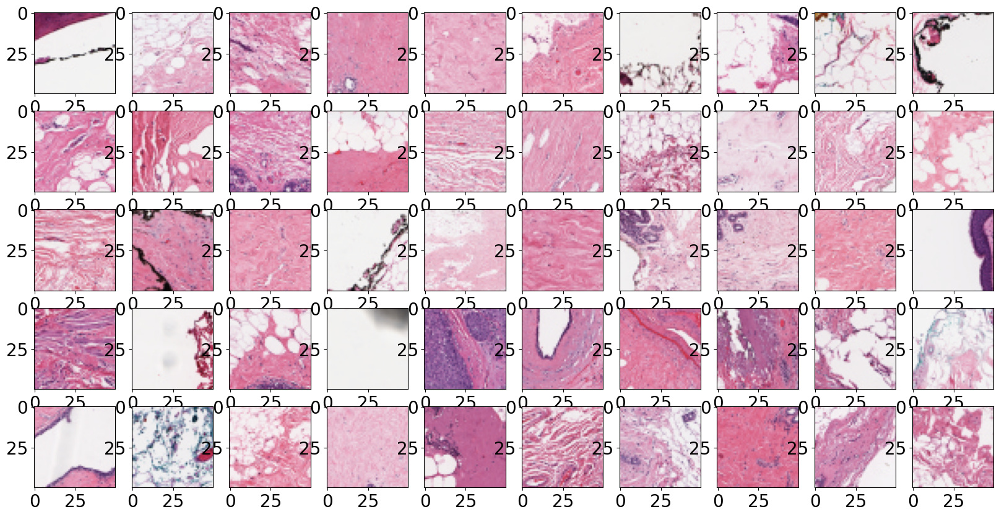

In [ ]:
#Healthy Patches
fig, ax = plt.subplots(5,10,figsize=(20,10))

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10*n]
        image = imread(data.loc[idx, "path"])
        ax[n,m].imshow(image)
        ax[n,m].grid(False)

#### Examine patients' images (10 samples, merged by patient_id)

In [ ]:
patient_sample = np.random.choice(data['patient_id'].unique(), size=10, replace=False)

In [ ]:
patient_sample

array(['10286', '9250', '15634', '12810', '16532', '9262', '8951',
       '10261', '10272', '9083'], dtype=object)

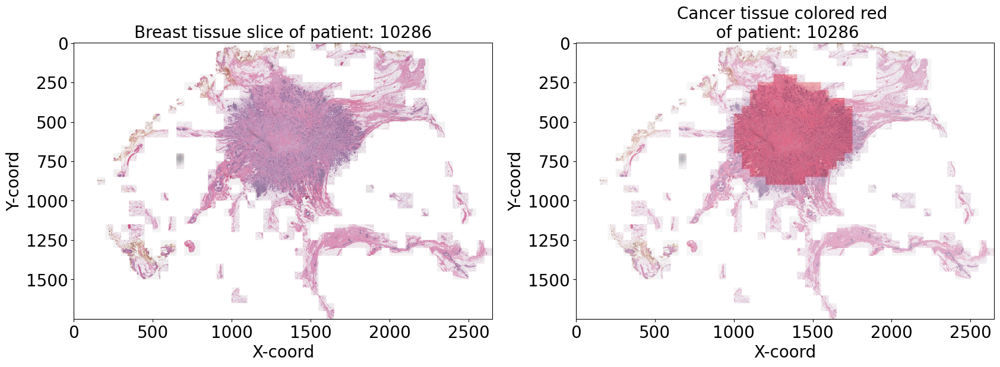

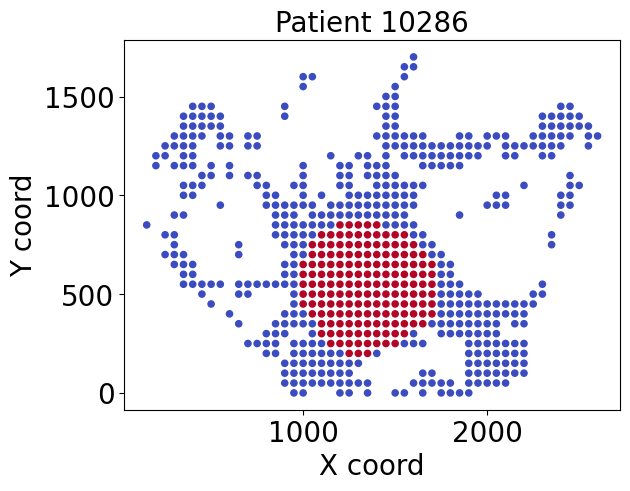

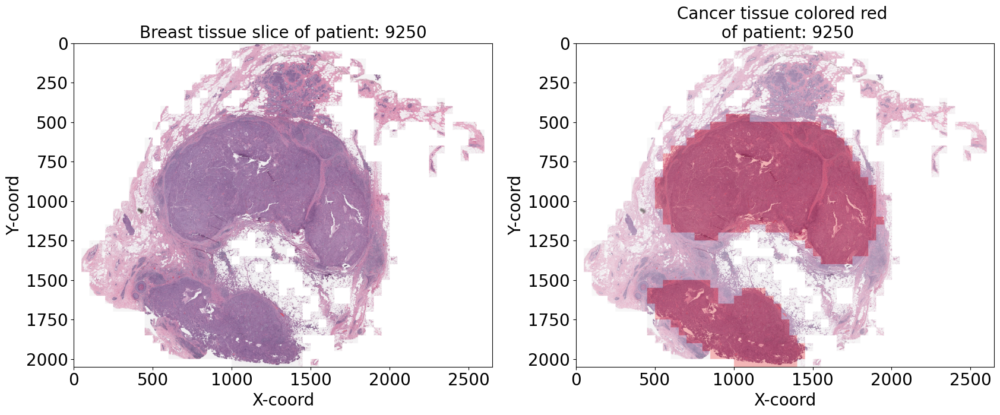

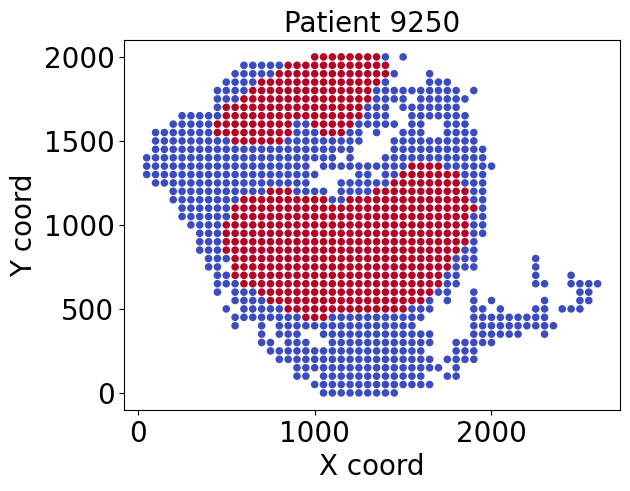

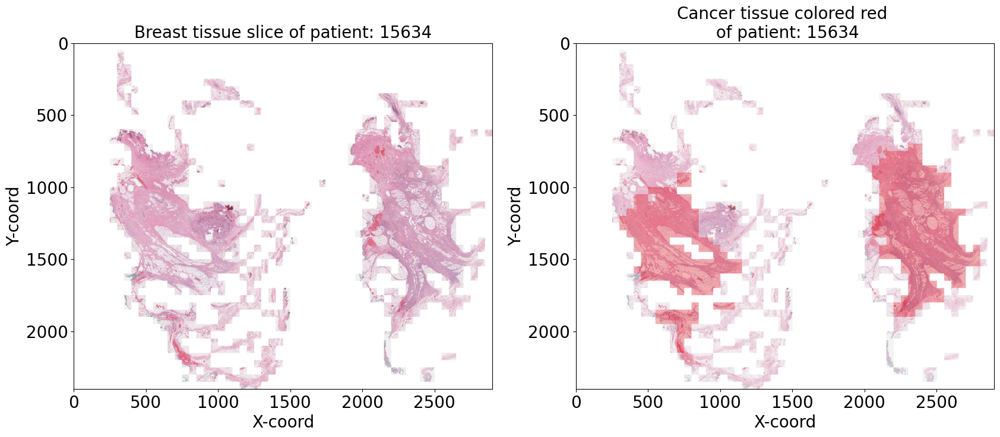

...

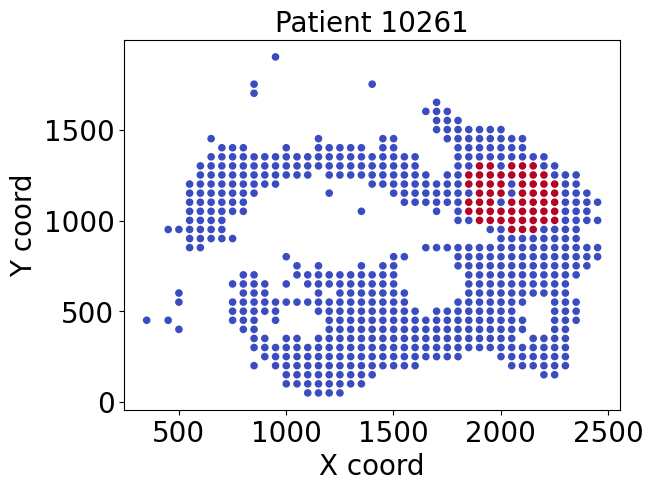

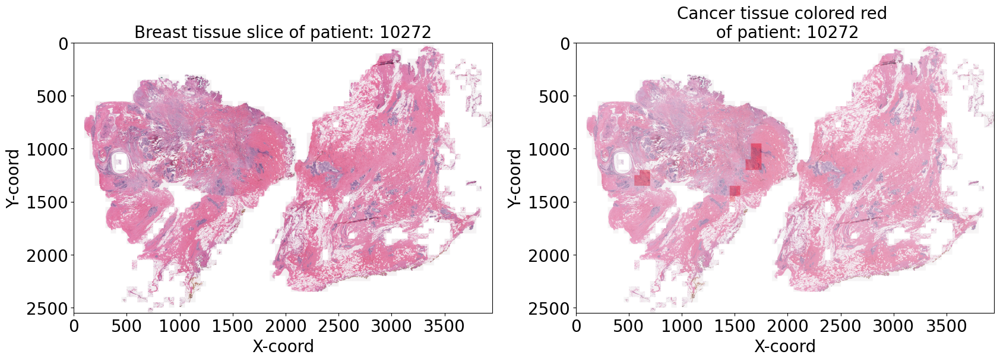

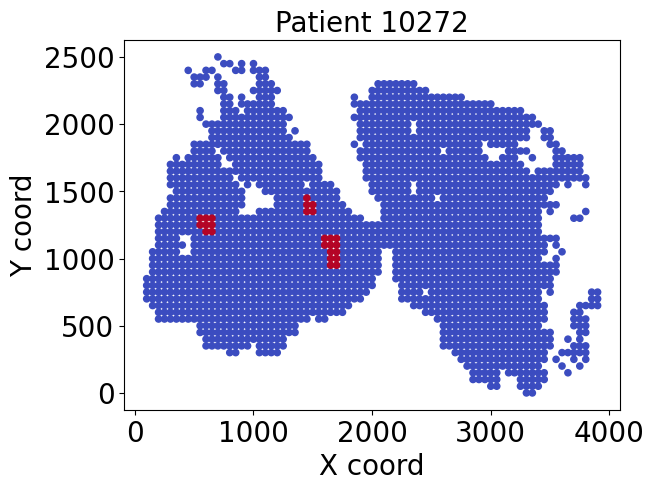

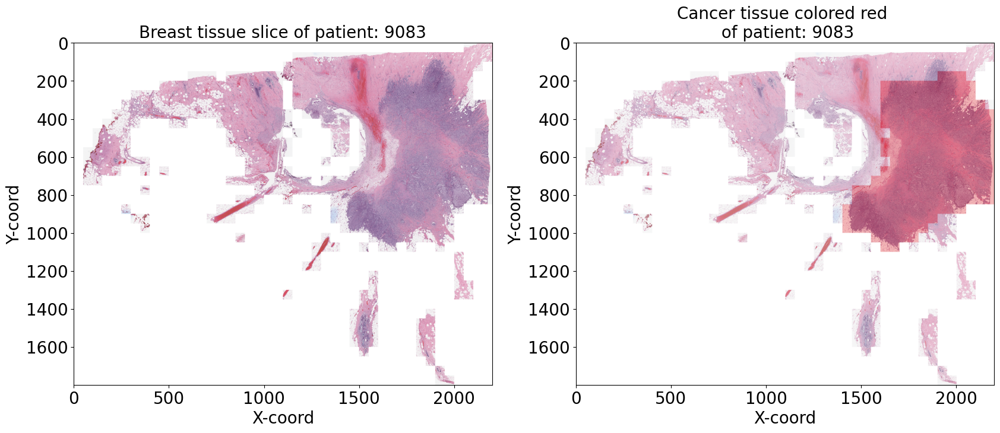

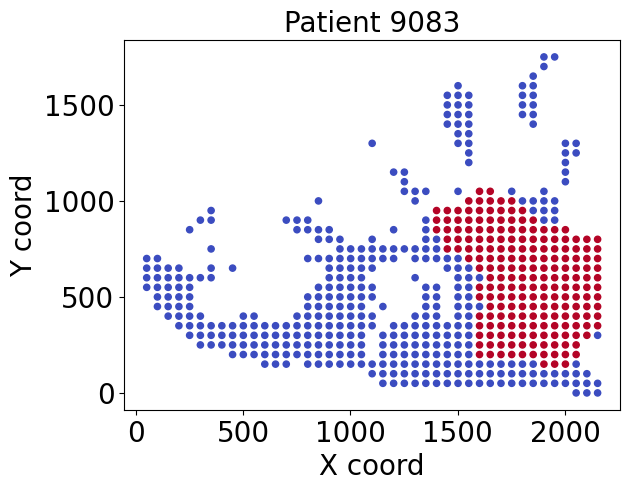

In [ ]:
for i in patient_sample:
  visualise_breast_tissue(i)
  visualise_breast_tissue_binary(i)

### <u> Summary of EDA  </u>

1. In terms of Pixcels, cancerous breast tissue samples have a tendency of being irregularly darker than the tissue around it.
2. On the other hand, healthy tissue tends to be more consistent with the tissue around it.

3. Regenerated images per Individual patients exhibit some typical characteristics as follows.
 * Pattern of cancer tissues: Centered, Dispersed, Irregularly distributed, or Clustered.
 * Size of cancer tissue: Varying sizes, Small, Large, or Unevenly sized
 * Shape of cancer tissue: Square, Circle, Oval, or Irregularly shaped




### Data Split: Getting the training (70%), validation(15%) and test data(15%)



In [ ]:
# Make a copy of orginal set
import copy
df = copy.deepcopy(data)

In [ ]:
print(df.shape[0]*0.7,df.shape[0]*0.85,df.shape[0])

194266.8 235895.4 277524


In [ ]:
# 2. Split data into train, validation, and test sets
train_df = df[:194266]
valid_df = df[194266:235896]
test_df = df[235896:277524]
print(train_df.shape[0]+valid_df.shape[0]+test_df.shape[0])

277524


In [ ]:
# 1. Randomly shuffle raw data
#df_shuffled = df.sample(frac=1, random_state=random_seed)
#df_shuffled.head(5)
# 2. Split the shuffled data into train, validation, and test sets
#train_df, remaining_df = train_test_split(df_shuffled, train_size=0.8, stratify=df_shuffled['patient_id'])
#valid_df, test_df = train_test_split(remaining_df, test_size=0.5, stratify=remaining_df['patient_id'])

In [ ]:
# Verify the result
pd.DataFrame([[["Train","Val","Test"],[train_df.shape[0],valid_df.shape[0],test_df.shape[0]]
               ,[round(train_df.shape[0]/df.shape[0]*100,1),round(valid_df.shape[0]/df.shape[0]*100,1),round(test_df.shape[0]/df.shape[0]*100,1)]]]
             , columns=['set','# rows', '# % of split'])

,set,# rows,# % of split
0,"[Train, Val, Test]","[194266, 41630, 41628]","[70.0, 15.0, 15.0]"


#### <font color='#6EB800'> *Oversampling for get balanced data (Code blocked)*</font>
   - When it comes to getting train set, oversampling of the cancer class was conducted. But it was disgarded at the final stage
   
   - because predict power on the validation and test set dramatically decreasaed. (this code is just for reference)

In [ ]:
# 3. Apply oversampling to address target imbalance (Jun 26: Temporary blocked oversample)
'''from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=random_seed)
X_train, y_train = train_df[['path']], train_df['target']
X_ros_train, y_ros_train = ros.fit_resample(X_train, y_train)'''

"from imblearn.over_sampling import RandomOverSampler\n\nros = RandomOverSampler(random_state=random_seed)\nX_train, y_train = train_df[['path']], train_df['target']\nX_ros_train, y_ros_train = ros.fit_resample(X_train, y_train)"

In [ ]:
# Verify the result
'''pd.DataFrame([[["Train_org","Train_oversampled"],[len(X_train),len(X_ros_train)]
               ,[round(sum(y_train)/len(X_train)*100,1),round(sum(y_ros_train)/len(X_ros_train)*100,1)]]]
             , columns=['set','# rows', '% of Cancerous(1) class'])'''

'pd.DataFrame([[["Train_org","Train_oversampled"],[len(X_train),len(X_ros_train)]\n               ,[round(sum(y_train)/len(X_train)*100,1),round(sum(y_ros_train)/len(X_ros_train)*100,1)]]]\n             , columns=[\'set\',\'# rows\', \'% of Cancerous(1) class\'])'

#### Finally dataset for training CNN model was ready as below.


In [ ]:
# Print the sizes of each set
#print(f'Train set size(% of target 1):{len(X_ros_train)} ({round(sum(y_ros_train)/len(X_ros_train)*100,1)})') #for oversampled train
print(f'Train set size(% of target 1):{len(train_df)} ({round(sum(train_df.target)/train_df.shape[0]*100,1)})')
print(f'Validation set size(% of target 1):{len(valid_df)} ({round(sum(valid_df.target)/valid_df.shape[0]*100,1)})')
print(f'Test set size(% of target 1):{len(test_df)} ({round(sum(test_df.target)/test_df.shape[0]*100,1)})')

Train set size(% of target 1):194266 (26.4)
Validation set size(% of target 1):41630 (31.1)
Test set size(% of target 1):41628 (35.0)


In [ ]:
test_df.target.value_counts()

0    27079
1    14549
Name: target, dtype: int64

In [ ]:
y_train = train_df['target']
y_valid = valid_df['target']
y_test = test_df['target']

In [ ]:
x_train = train_df['path']
x_valid = valid_df['path']
x_test = test_df['path']

In [ ]:
#from tensorflow.keras.utils import to_categorical [IF We want softmax as activation function- like multiclass]
#y_ros_train_2 = to_categorical(y_ros_train, num_classes = 2) #for oversampled train
y_train_2 = to_categorical(y_train, num_classes = 2)
y_valid_2 = to_categorical(y_valid, num_classes = 2)
y_test_2 = to_categorical(y_test, num_classes = 2)

In [ ]:
#4.Convert oversampled data to TensorFlow Datasets
#train_data = tf.data.Dataset.from_tensor_slices((X_ros_train['path'], y_ros_train_2)) #y_ros_train_2: when softmax
train_data = tf.data.Dataset.from_tensor_slices((train_df['path'], y_train_2))
valid_data = tf.data.Dataset.from_tensor_slices((valid_df['path'], y_valid_2))
test_data = tf.data.Dataset.from_tensor_slices((test_df['path'], y_test_2))

In [ ]:
print(tf.data.experimental.cardinality(train_data).numpy(),tf.data.experimental.cardinality(valid_data).numpy(),tf.data.experimental.cardinality(test_data).numpy())

194266 41630 41628


In [ ]:
import tensorflow as tf

# 5. Save the TensorFlow dataset
tf.data.Dataset.save(train_data,abspath_curr+ 'train_data.tfrecord') #"/path/to/save/dataset"
tf.data.Dataset.save(valid_data,abspath_curr+ 'valid_data.tfrecord')
tf.data.Dataset.save(test_data,abspath_curr+ 'test_data.tfrecord')

In [ ]:
os.chdir(abspath_curr) #os.chdir(abspath_curr+"Functions") #Move
print(os.listdir()) #len(files) #Check files
#os.remove('')

['data', 'teaching', 'classification.ipynb', 'regression.ipynb', 'Notebooks', 'Homework_1_Alwhebie_Muhannad.ipynb', 'Copy of Loan Prediction Based on Customer Behavior.ipynb', 'Functions', 'train_data.tfrecord', 'valid_data.tfrecord', 'test_data.tfrecord', 'result', 'model.png', 'Homework_2_Alwhebie.ipynb', 'breast-histopathology-images.zip', '10253', '10254', '10255', '10256', '10257', '10258', '10259', '10260', '10261', '10262', '10264', '10268', '10269', '10272', '10273', '10274', '10275', '10276', '10277', '10278', '10279', '10282', '10285', '10286', '10288', '10290', '10291', '10292', '10293', '10295', '10299', '10300', '10301', '10302', '10303', '10304', '10305', '10306', '10307', '10308', '12241', '12242', '12626', '12748', '12749', '12750', '12751', '12752', '12810', '12811', '12817', '12818', '12819', '12820', '12821', '12822', '12823', '12824', '12826', '12867', '12868', '12869', '12870', '12871', '12872', '12873', '12875', '12876', '12877', '12878', '12879', '12880', '12881'

### <u> Summary of Data Split Processing  </u>
    Train set size(% of target 1):317,816 (50%)
    Validation set size(% of target 1):27,752 (28.2%)
    Test set size(% of target 1):27,753 (28.3%)

<font color='#F5842F'><u> Applied Steps</u></font>

1. Randomly shuffle the Raw Data
2. Split Train(70%), Validation(15%), Test (15%) respectively
  - constraint 2: Not to be biased for the target (Handling class imbalance)

3. Transform the datasets into a TensorFlow Dataset (to work with Keras)




## 2. Modeling - Section 1
  - Transfer learning (pre-trained architectures: ResNet)

### <u> Summary of Entire Modeling Strategy  </u>
1. (Section 1) Train initial model by applying General pre-trained architectures (ResNet)
  - Tweak for training: Resizing, Architecture (Add GlobalAveragePooling2D layer, etc.)
  - Train in the initially set condition (epochs, batch size, learning rate, hyper-parameter optimizer etc)

2. (Section 2) Update model by applying different pre-trained architectures
  
   (1) Apply other Architectures (recommendable for a medical or breast cancer image classification)
     - Tweak for training: Presrocessing, set parameter,etc.
     - Additional experiement for improving predict power  
  
   (2) Final model
     - Pick the best model (compare performance)  


#### <font color='#6EB800'> *Check Point: Load Tensorflow data*</font>


In [ ]:
# Load the saved dataset
train_data = tf.data.Dataset.load(abspath_curr+ 'train_data.tfrecord')
valid_data = tf.data.Dataset.load(abspath_curr+ 'valid_data.tfrecord')
test_data = tf.data.Dataset.load(abspath_curr+ 'test_data.tfrecord')

In [ ]:
print(tf.data.experimental.cardinality(train_data).numpy(),tf.data.experimental.cardinality(valid_data).numpy(),tf.data.experimental.cardinality(test_data).numpy())

194266 41630 41628


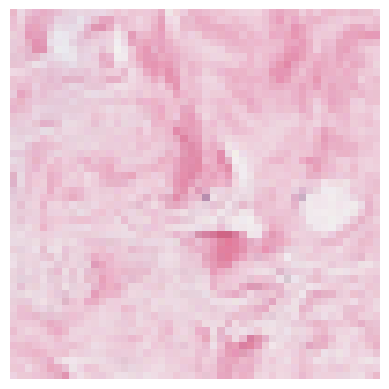

In [ ]:
#Check the sample image of tensorflow data
sample_image3, sample_label3 = next(iter(train_data)) #valid_data, test_data

image2 = tf.io.read_file(sample_image3)
image2 = tf.image.decode_jpeg(image2, channels=3)
plt.imshow(image2)
plt.axis('off')
plt.show()

In [ ]:
#Check the resolution (for sample)
resolution = image2.shape[:3]
print("Image resolution:", resolution)

Image resolution: (50, 50, 3)



### <font color='#69adff'>RESNet50 Pretrained Model</font>

  * ResNet50 trained on ImageNetis considered as pretrained model.
  * ResNet50 is characterized by a new neural network layer, the so called Residual Block with the ‘Skip Connection'.
  
  Concept of Residual Block

  '![ResNet-Residual block](https://miro.medium.com/v2/resize:fit:592/format:webp/1*h83Qyw1nU4-xoqfRsfL7KQ.png)'


### Resizing the data for pretrained model

In [ ]:
# Set the default input size for the pretrained model ResNet
global input_size
input_size = [224,224, 3] # [224,224] [224, 224, 3]

In [ ]:
def resize(image_path, label):
    # Read and decode the image from the file path
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize the image to the desired dimensions
    resized_image = tf.image.resize(image, [input_size[0], input_size[1]])

    # Normalize the pixel values between 0 and 1
  #  resized_image = resized_image / 255.0

    return resized_image, label

In [ ]:
train_data_rs = train_data.map(resize)

In [ ]:
valid_data_rs = valid_data.map(resize)
test_dat_rs = test_data.map(resize)

### Preprocessing the data using pretrained model

In [ ]:
# Set the preprocess_input of the pretrained model
global preprocess_input
preprocess_input = tf.keras.applications.resnet.preprocess_input

In [ ]:
# Preprocess the training data using pretrained model
train_data_rs = train_data_rs.map(preprocess_pretrain)

# Preprocess the validation data using pretrained model
valid_data_rs = valid_data_rs.map(preprocess_pretrain)

# Preprocess the test data using pretrained model
test_dat_rs = test_dat_rs.map(preprocess_pretrain)

### Shuffling, batching and prefetching the data
  * batch_size = 32

In [ ]:
# Shuffling the training data
train_data_rs = train_data_rs.shuffle(buffer_size=1000, seed=random_seed)

# Set the batch size
batch_size = 32 #16  16 -> 32 -65

# Batch and prefetch the training data
train_data_rs = train_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the validation data
valid_data_rs = valid_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the test data
test_dat_rs = test_dat_rs.batch(batch_size).prefetch(1)

### Building the architecture of the model

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/model/')
if not os.path.exists(directory):
    os.makedirs(directory)

In [ ]:
# Add the pretrained layers
pretrained_model = keras.applications.ResNet50(include_top=False, weights='imagenet')

# Add GlobalAveragePooling2D layer
average_pooling = keras.layers.GlobalAveragePooling2D()(pretrained_model.output)

# Add the output layer
output = keras.layers.Dense(2, activation='softmax')(average_pooling)  #softmax w two class
#output = keras.layers.Dense(1, activation='sigmoid')(average_pooling)  #binary
#output = keras.layers.Dense(n_classes, activation='softmax')(average_pooling) #n_classes = multi

# Get the model
model = keras.Model(inputs=pretrained_model.input, outputs=output)

model.summary()

94765736/94765736 [==============================] - 5s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                             

### **RESNET50-1. Freezing and Callback**
  * EarlyStopping: 2

### Freezing and Callback
  * EarlyStopping: 2

In [ ]:
# Freezing the pretrained layers: For each layer in the pretrained model
for layer in pretrained_model.layers:
    # Freeze the layer
    layer.trainable = False

In [ ]:
# ModelCheckpoint callback
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath=abspath_curr + '/result/model/model.base_resnet_v4',  #model.base_resnet_v2: softmax,oversample
                                                      save_best_only=True,
                                                      save_weights_only=True)

# EarlyStopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = keras.callbacks.ReduceLROnPlateau(factor=0.1,
                                                            patience=1)


### Compiling and Training the model

 * learning_rate=0.01, Adam optimizer, **softmax **

In [ ]:
# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
              loss='categorical_crossentropy',  #sparse_categorical_crossentropy: Multiclass, categorical_crossentropy,
              metrics=['accuracy'])

In [ ]:
# Train, evaluate and save the best model
history = model.fit(train_data_rs,
                    epochs=10,
                    validation_data=valid_data_rs,
                    callbacks=[model_checkpoint_cb,
                               early_stopping_cb,
                               reduce_lr_on_plateau_cb])

Epoch 1/10
6071/6071 [==============================] - 691s 112ms/step - loss: 0.6359 - accuracy: 0.8905 - val_loss: 1.0448 - val_accuracy: 0.8408 - lr: 0.0100
Epoch 2/10
6071/6071 [==============================] - 679s 112ms/step - loss: 0.6565 - accuracy: 0.8914 - val_loss: 0.9761 - val_accuracy: 0.8419 - lr: 0.0100
Epoch 3/10
6071/6071 [==============================] - 674s 111ms/step - loss: 0.6783 - accuracy: 0.8908 - val_loss: 1.0541 - val_accuracy: 0.8403 - lr: 0.0100
Epoch 4/10
6071/6071 [==============================] - 678s 112ms/step - loss: 0.3917 - accuracy: 0.8940 - val_loss: 0.5381 - val_accuracy: 0.8522 - lr: 1.0000e-03
Epoch 5/10
6071/6071 [==============================] - 677s 111ms/step - loss: 0.3108 - accuracy: 0.8987 - val_loss: 0.4554 - val_accuracy: 0.8530 - lr: 1.0000e-03
Epoch 6/10
6071/6071 [==============================] - 708s 116ms/step - loss: 0.2834 - accuracy: 0.9012 - val_loss: 0.4376 - val_accuracy: 0.8480 - lr: 1.0000e-03
Epoch 7/10
6071/6071 [

### Plotting the learning curve

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/figure/')
if not os.path.exists(directory):
    os.makedirs(directory)

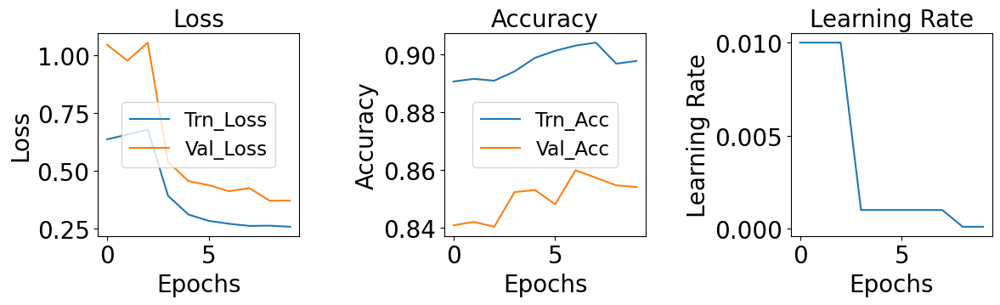

In [ ]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Plot the loss
axes[0].plot(history.history['loss'], label='Trn_Loss')
axes[0].plot(history.history['val_loss'], label='Val_Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss')
axes[0].legend(loc='center',fontsize='small') #loc='upper right',

# Plot the accuracy
axes[1].plot(history.history['accuracy'], label='Trn_Acc')
axes[1].plot(history.history['val_accuracy'], label='Val_Acc')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Accuracy')
axes[1].legend(loc='center',fontsize='small') #loc='lower right',

# Plot the learning rate
axes[2].plot(history.history['lr'])
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Learning Rate')
axes[2].set_title('Learning Rate')

# Adjust the spacing between subplots
plt.tight_layout()

# Save and show the figure
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section1_ResNet_before_freezing_v2.pdf')
plt.show()

In [ ]:
'''import pandas as pd

# Create a figure
pd.DataFrame(history.history).plot(figsize=(8, 5))

# Set grid
plt.grid(True)

# Save and show the figure
plt.tight_layout()
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section1_ResNet_before_freezing_v2.pdf')
plt.show()'''

### Evaluate model

In [ ]:
# Load the saved model
model.load_weights(filepath=abspath_curr + '/result/model/model.base_resnet_v4')
loss, accuracy = model.evaluate(test_dat_rs)

1301/1301 [==============================] - 117s 90ms/step - loss: 0.3884 - accuracy: 0.8464


#### Confusion matrix
<font color='red'>Recently updated version</font>

In [ ]:
# Extract the features (X_test) and true labels (Y_true)
X_test = test_dat_rs.map(lambda x, y: x)  # Assuming the features are in the first column
Y_true = y_test_2  # Assuming the true labels are in the second column

# Predict the labels for the test set
Y_pred = model.predict(X_test)

# Convert the true and predicted labels to binary format
Y_true_binary = np.argmax(Y_true, axis=1)
Y_pred_binary = np.argmax(Y_pred, axis=1)

# Create the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

1301/1301 [==============================] - 113s 86ms/step


In [ ]:
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

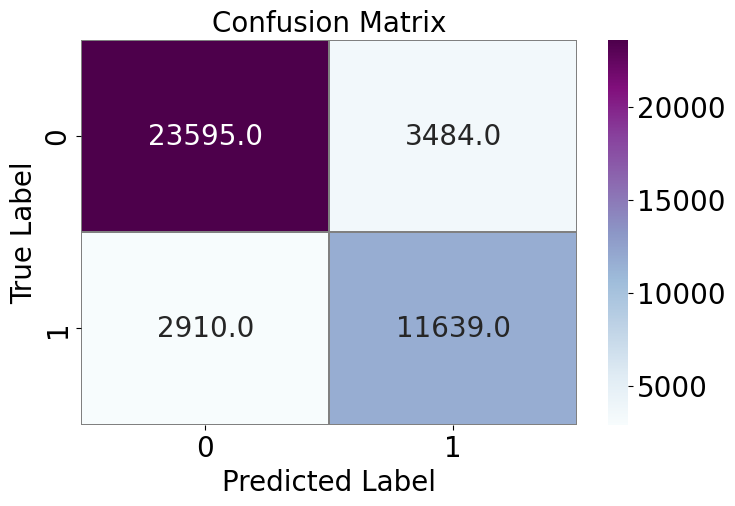

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="BuPu", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

***ResNet with freezing pretrained layers showed 76.9% of real cancer prediction and 89.0% precision for determine healty units**

In [ ]:
23595/(2910+23595)

0.8902093944538766

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(Y_true_binary, Y_pred_binary)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(Y_true_binary, Y_pred_binary)
print("Precision:", precision)

# Calculate recall
recall = recall_score(Y_true_binary, Y_pred_binary)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_true_binary, Y_pred_binary)
print(f'F1 score:,{f1}')

Accuracy: 0.8464014605553954
Precision: 0.7696224294121536
Recall: 0.7999862533507458
F1 score:,0.7845106497708277


### **RESNET50-2. Re-trainning: Unfreezing the pretrained layers**



### Re-trainning: Unfreezing the pretrained layers

In [ ]:
# For each layer in the pretrained model
for layer in pretrained_model.layers:
    # Unfreeze the layer
    layer.trainable = True

In [ ]:
# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='binary_crossentropy',  #sparse_categorical_crossentropy: Multiclass
              metrics=['accuracy'])

In [ ]:
# Train, evaluate and save the best model
history = model.fit(train_data_rs,
                    epochs=10,
                    validation_data=valid_data_rs,
                    callbacks=[model_checkpoint_cb,
                               early_stopping_cb,
                               reduce_lr_on_plateau_cb])

Epoch 1/10
6071/6071 [==============================] - 374s 60ms/step - loss: 0.3560 - accuracy: 0.8633 - val_loss: 0.7692 - val_accuracy: 0.7641 - lr: 0.0010
Epoch 2/10
6071/6071 [==============================] - 363s 60ms/step - loss: 0.3047 - accuracy: 0.8761 - val_loss: 0.8046 - val_accuracy: 0.7982 - lr: 0.0010
Epoch 3/10
6071/6071 [==============================] - 363s 60ms/step - loss: 0.3300 - accuracy: 0.8594 - val_loss: 0.3190 - val_accuracy: 0.8618 - lr: 1.0000e-04
Epoch 4/10
6071/6071 [==============================] - 363s 60ms/step - loss: 0.3063 - accuracy: 0.8714 - val_loss: 0.3354 - val_accuracy: 0.8550 - lr: 1.0000e-04
Epoch 5/10
6071/6071 [==============================] - 363s 60ms/step - loss: 0.3269 - accuracy: 0.8596 - val_loss: 0.3144 - val_accuracy: 0.8677 - lr: 1.0000e-05
Epoch 6/10
6071/6071 [==============================] - 363s 60ms/step - loss: 0.3182 - accuracy: 0.8633 - val_loss: 0.3106 - val_accuracy: 0.8687 - lr: 1.0000e-05
Epoch 7/10
6071/6071 [==

### Plotting the learning curve

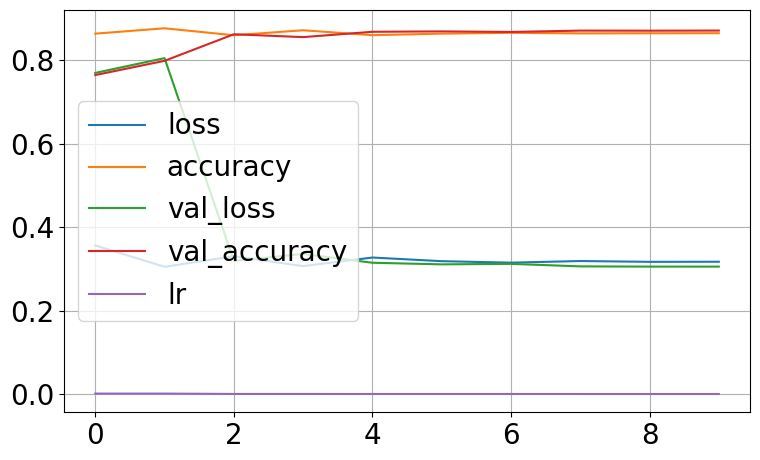

In [ ]:
import pandas as pd

# Create a figure
pd.DataFrame(history.history).plot(figsize=(8, 5))

# Set grid
plt.grid(True)

# Save and show the figure
plt.tight_layout()
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section1_ResNet_before_unfreezing.pdf')
plt.show()

### Evaluate model

In [ ]:
# Load the saved model
model.load_weights(filepath=abspath_curr + '/result/model/model.base_resnet_v3')
loss, accuracy = model.evaluate(test_dat_rs)

1301/1301 [==============================] - 71s 47ms/step - loss: 0.3151 - accuracy: 0.8673


#### Confusion matrix

In [ ]:
# Extract the features (X_test) and true labels (Y_true)
X_test = test_dat_rs.map(lambda x, y: x)  # Assuming the features are in the first column
Y_true = y_test_2  # Assuming the true labels are in the second column

# Predict the labels for the test set
Y_pred = model.predict(X_test)

# Convert the true and predicted labels to binary format
Y_true_binary = np.argmax(Y_true, axis=1)
Y_pred_binary = np.argmax(Y_pred, axis=1)

# Create the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

1301/1301 [==============================] - 64s 49ms/step


In [ ]:
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

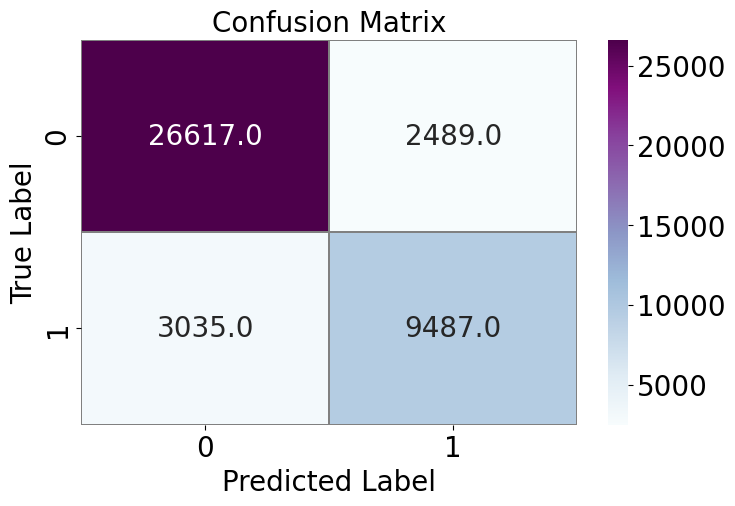

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="BuPu", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

***ResNet with Un-freezing pretrained layers showed 79.2% of real cancer prediction and 89.8% precision for determine healty units**

In [ ]:
26617/(3035+26617)

0.8976460272494267

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(Y_true_binary, Y_pred_binary)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(Y_true_binary, Y_pred_binary)
print("Precision:", precision)

# Calculate recall
recall = recall_score(Y_true_binary, Y_pred_binary)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_true_binary, Y_pred_binary)
print(f'F1 score:,{f1}')

Accuracy: 0.8673008551936197
Precision: 0.7921676686706747
Recall: 0.7576265772240857
F1 score:,0.7745122050779655


## 3. Modeling - Section 2
  
   (1) Apply other Architectures
     - EfficientNet, VGG16  
  
   (2) Finalize model
     - Pick the best model


### <font color='#69adff'> 3-1. EfficientNet Pretrained Model</font>

  * EfficientNet is an efficient and scalable CNN architecture for image classification.

  * EfficientNet utilizes residual blocks to enable efficient gradient flow and capture complex features.
  
  Concept of Residual Blocks



  '![ResNet-Residual block](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*mofq4xJKz9YKd6jwf-8wug.png)'


In [ ]:
# Input size is same as RESNet (224,224,3)
height = 224
width = 224
channels = 3
input_shape = (height, width, channels)

In [ ]:
# Do not need to resize
#train_data_rs
#valid_data_rs
#test_dat_rs

In [ ]:
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB3, EfficientNetB4, EfficientNetB7

In [ ]:
n_classes = 2
epochs = 5
batch_size = 32

### Preprocessing the data using pretrained model

In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input

In [ ]:
# Set the preprocess_input of the pretrained model
global preprocess_input
preprocess_input = tf.keras.applications.efficientnet.preprocess_input

In [ ]:
# Preprocess the training data using pretrained model
train_data_rs = train_data_rs.map(preprocess_pretrain)

# Preprocess the validation data using pretrained model
valid_data_rs = valid_data_rs.map(preprocess_pretrain)

# Preprocess the test data using pretrained model
test_dat_rs = test_dat_rs.map(preprocess_pretrain)

### Shuffling, batching and prefetching the data
  * batch_size = 32

In [ ]:
# Shuffling the training data
train_data_rs = train_data_rs.shuffle(buffer_size=1000, seed=random_seed)

# Set the batch size
batch_size = 32 #16  16 -> 32 -65

# Batch and prefetch the training data
train_data_rs = train_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the validation data
valid_data_rs = valid_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the test data
test_dat_rs = test_dat_rs.batch(batch_size).prefetch(1)

### Building the architecture of the model

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/model/')
if not os.path.exists(directory):
    os.makedirs(directory)

In [ ]:
# Add the pretrained layers
pretrained_model = EfficientNetB7(weights='imagenet', include_top=False, input_shape=input_shape, classes=n_classes) #EfficientNetB7

# Add GlobalAveragePooling2D layer
average_pooling = keras.layers.GlobalAveragePooling2D()(pretrained_model.output)

# Add the output layer
output = keras.layers.Dense(2, activation='softmax')(average_pooling)  #softmax w two class
#output = keras.layers.Dense(1, activation='sigmoid')(average_pooling)  #binary
#output = keras.layers.Dense(n_classes, activation='softmax')(average_pooling) #n_classes = multi

# Get the model
model = keras.Model(inputs=pretrained_model.input, outputs=output)

model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_3[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0]']    

### **EfficientNetB7-1. Freezing and Callback**
  * EarlyStopping: 2

In [ ]:
# Freezing the pretrained layers: For each layer in the pretrained model
for layer in pretrained_model.layers:
    # Freeze the layer
    layer.trainable = False

In [ ]:
# ModelCheckpoint callback
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath=abspath_curr + '/result/model/model.effinet_v1',  #model.base_resnet_v2: softmax,oversample
                                                      save_best_only=True,
                                                      save_weights_only=True)

# EarlyStopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = keras.callbacks.ReduceLROnPlateau(factor=0.1,
                                                            patience=1)

#### <font color='#6EB800'> optimizers options (blocked)</font>

In [ ]:
'''
#1.  Power Scheduling
# Compile the model
model.compile(optimizer=keras.optimizers.SGD(decay=1e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])'''

"\n#1.  Power Scheduling\n# Compile the model\nmodel.compile(optimizer=keras.optimizers.SGD(decay=1e-4),\n              loss='sparse_categorical_crossentropy',\n              metrics=['accuracy'])"

In [ ]:
'''
#2.  Exponential Scheduling
# Get the number of samples in the training data
m = tf.data.experimental.cardinality(data_train).numpy()

# Set the decay_steps
s = 20 * m / batch_size

# Get the learning rate produced by Exponential Scheduling
learning_rate = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.01,
                                                            decay_steps=s,
                                                            decay_rate=0.1)

# Compile the model
model.compile(optimizer=keras.optimizers.SGD(learning_rate=learning_rate),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])'''

"\n#2.  Exponential Scheduling\n# Get the number of samples in the training data\nm = tf.data.experimental.cardinality(data_train).numpy()\n\n# Set the decay_steps\ns = 20 * m / batch_size\n\n# Get the learning rate produced by Exponential Scheduling\nlearning_rate = keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.01,\n                                                            decay_steps=s,\n                                                            decay_rate=0.1)\n\n# Compile the model\nmodel.compile(optimizer=keras.optimizers.SGD(learning_rate=learning_rate),\n              loss='sparse_categorical_crossentropy',\n              metrics=['accuracy'])"

In [ ]:
'''#3. Performance Scheduling
# Compile the model
model.compile(optimizer=keras.optimizers.SGD(),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])'''

"#3. Performance Scheduling\n# Compile the model\nmodel.compile(optimizer=keras.optimizers.SGD(),\n              loss='sparse_categorical_crossentropy',\n              metrics=['accuracy'])"


### Compiling and Training the model

 * learning_rate=0.01, Adam optimizer, **Changed to softmax + delete oversample**

In [ ]:
# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
              loss='categorical_crossentropy',  #sparse_categorical_crossentropy: Multiclass, categorical_crossentropy,
              metrics=['accuracy'])
##reducing learning rate on plateau
#rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience= 5, factor= 0.5, min_lr= 1e-6, verbose=1)

In [ ]:
# Train, evaluate and save the best model
history = model.fit(train_data_rs,
                    epochs=10,
                    validation_data=valid_data_rs,
                    callbacks=[model_checkpoint_cb,
                               early_stopping_cb,
                               reduce_lr_on_plateau_cb])

Epoch 1/10
3706/6071 [=================>............] - ETA: 14:12 - loss: 0.4197 - accuracy: 0.8651

### Plotting the learning curve

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/figure/')
if not os.path.exists(directory):
    os.makedirs(directory)

In [ ]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Plot the loss
axes[0].plot(history.history['loss'], label='Trn_Loss')
axes[0].plot(history.history['val_loss'], label='Val_Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss')
axes[0].legend(loc='center',fontsize='small') #loc='upper right',

# Plot the accuracy
axes[1].plot(history.history['accuracy'], label='Trn_Acc')
axes[1].plot(history.history['val_accuracy'], label='Val_Acc')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Accuracy')
axes[1].legend(loc='center',fontsize='small') #loc='lower right',

# Plot the learning rate
axes[2].plot(history.history['lr'])
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Learning Rate')
axes[2].set_title('Learning Rate')

# Adjust the spacing between subplots
plt.tight_layout()

# Save and show the figure
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section2_EffiNet_after_freezing_v1.pdf')
plt.show()

### Evaluate model(Efficientnet)

In [ ]:
# Load the saved model
model.load_weights(filepath=abspath_curr + '/result/model/model.effinet_v1') #vo: 0.8181
loss, accuracy = model.evaluate(test_dat_rs)

1301/1301 [==============================] - 467s 351ms/step - loss: 0.3353 - accuracy: 0.8629


#### Confusion matrix

In [ ]:
# Extract the features (X_test) and true labels (Y_true)
X_test = test_dat_rs.map(lambda x, y: x)  # Assuming the features are in the first column
Y_true = y_test_2  # Assuming the true labels are in the second column

# Predict the labels for the test set
Y_pred = model.predict(X_test)

# Convert the true and predicted labels to binary format
Y_true_binary = np.argmax(Y_true, axis=1)
Y_pred_binary = np.argmax(Y_pred, axis=1)

# Create the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

1301/1301 [==============================] - 452s 343ms/step


In [ ]:
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

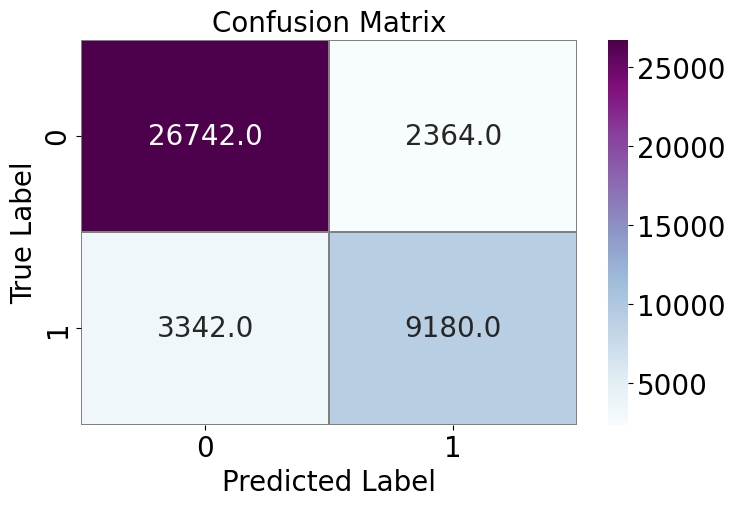

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="BuPu", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

**EfficientNet with freezing pretrained layers showed 79.5% of real cancer prediction and 88.9% precision for determine healty units**

In [ ]:
26742/(26742+3342)

0.8889110490626246

** We get 79.5% of real cancer prediction, however,earned 88.9% precision for determine healty units**

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score
# Calculate accuracy
accuracy = accuracy_score(Y_true_binary, Y_pred_binary)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(Y_true_binary, Y_pred_binary)
print("Precision:", precision)

# Calculate recall
recall = recall_score(Y_true_binary, Y_pred_binary)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_true_binary, Y_pred_binary)
print(f'F1 score:,{f1}')

Accuracy: 0.862928797924474
Precision: 0.7952182952182952
Recall: 0.73310972688069
F1 score:,0.762902019446522


### **EfficientNetB7-2. Unfreezing and Callback**
  * EarlyStopping: 2

In [ ]:
# For each layer in the pretrained model
for layer in pretrained_model.layers:
    # Unfreeze the layer
    layer.trainable = True

In [ ]:
# ModelCheckpoint callback
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath=abspath_curr + '/result/model/model.effinet_v2',  #model.base_resnet_v2: softmax,oversample
                                                      save_best_only=True,
                                                      save_weights_only=True)

# EarlyStopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = keras.callbacks.ReduceLROnPlateau(factor=0.1,
                                                            patience=1)


### Compiling and Training the model

 * learning_rate=0.001, Adam optimizer, **Changed to softmax + delete oversample**

In [ ]:
# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',  #sparse_categorical_crossentropy: Multiclass, categorical_crossentropy,
              metrics=['accuracy'])
##reducing learning rate on plateau
#rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience= 5, factor= 0.5, min_lr= 1e-6, verbose=1)

In [ ]:
# Train, evaluate and save the best model
history = model.fit(train_data_rs,
                    epochs=5,
                    validation_data=valid_data_rs,
                    callbacks=[model_checkpoint_cb,
                               early_stopping_cb,
                               reduce_lr_on_plateau_cb])

Epoch 1/5
6071/6071 [==============================] - 2165s 349ms/step - loss: 0.2922 - accuracy: 0.8822 - val_loss: 0.5054 - val_accuracy: 0.8578 - lr: 0.0010
Epoch 2/5
6071/6071 [==============================] - 2111s 348ms/step - loss: 0.2860 - accuracy: 0.8840 - val_loss: 0.3236 - val_accuracy: 0.8705 - lr: 0.0010
Epoch 3/5
3079/6071 [==============>...............] - ETA: 16:18 - loss: 0.2764 - accuracy: 0.8869

### Plotting the learning curve

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/figure/')
if not os.path.exists(directory):
    os.makedirs(directory)

NameError: ignored

In [ ]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Plot the loss
axes[0].plot(history.history['loss'], label='Trn_Loss')
axes[0].plot(history.history['val_loss'], label='Val_Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss')
axes[0].legend(loc='center',fontsize='small') #loc='upper right',

# Plot the accuracy
axes[1].plot(history.history['accuracy'], label='Trn_Acc')
axes[1].plot(history.history['val_accuracy'], label='Val_Acc')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Accuracy')
axes[1].legend(loc='center',fontsize='small') #loc='lower right',

# Plot the learning rate
axes[2].plot(history.history['lr'])
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Learning Rate')
axes[2].set_title('Learning Rate')

# Adjust the spacing between subplots
plt.tight_layout()

# Save and show the figure
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section2_EffiNet_after_unfreezing_v0.pdf')
plt.show()

### Evaluate model(Efficientnet)

In [ ]:
# Load the saved model
model.load_weights(filepath=abspath_curr + '/result/model/model.effinet_v2')
loss, accuracy = model.evaluate(test_dat_rs)

1301/1301 [==============================] - 131s 93ms/step - loss: 0.3965 - accuracy: 0.8434


#### Confusion matrix

In [ ]:
# Extract the features (X_test) and true labels (Y_true)
X_test = test_dat_rs.map(lambda x, y: x)  # Assuming the features are in the first column
Y_true = y_test_2  # Assuming the true labels are in the second column

# Predict the labels for the test set
Y_pred = model.predict(X_test)

# Convert the true and predicted labels to binary format
Y_true_binary = np.argmax(Y_true, axis=1)
Y_pred_binary = np.argmax(Y_pred, axis=1)

# Create the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

1301/1301 [==============================] - 121s 93ms/step


In [ ]:
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

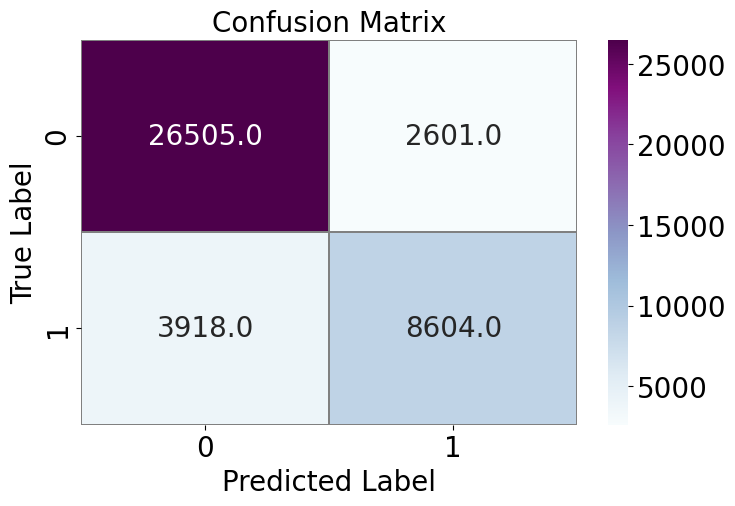

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="BuPu", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

***EfficientNet with Un-freezing pretrained layers showed 76.8% of real cancer prediction and 87.1% precision for determine healty units**

In [ ]:
26505/(3918+26505)

0.8712158564244158

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score
# Calculate accuracy
accuracy = accuracy_score(Y_true_binary, Y_pred_binary)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(Y_true_binary, Y_pred_binary)
print("Precision:", precision)

# Calculate recall
recall = recall_score(Y_true_binary, Y_pred_binary)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_true_binary, Y_pred_binary)
print(f'F1 score:,{f1}')

Accuracy: 0.8433986739694437
Precision: 0.7678714859437751
Recall: 0.6871106851940585
F1 score:,0.7252497155139714



### <font color='#69adff'>3-2. VGG16 Pretrained Model</font>

  * VGG16 is considered to be one of the excellent vision model architecture till date. Most unique thing about VGG16 is that instead of having a large number of hyper-parameter they focused on having convolution layers of 3x3 filter with a stride 1 and always used same padding and maxpool layer of 2x2 filter of stride 2.

  '![VGG16](https://miro.medium.com/v2/resize:fit:640/format:webp/1*3-TqqkRQ4rWLOMX-gvkYwA.png)'


In [ ]:
# Input size is same as RESNet (224,224,3)
height = 224
width = 224
channels = 3
input_shape = (height, width, channels)

In [ ]:
from tensorflow.keras.applications import VGG16

In [ ]:
n_classes = 2
epochs = 5
batch_size = 32

### Preprocessing the data using pretrained VGG16 model

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

In [ ]:
# Set the preprocess_input of the pretrained model
global preprocess_input
preprocess_input = tf.keras.applications.vgg16.preprocess_input

In [ ]:
# Preprocess the training data using pretrained model
train_data_rs = train_data_rs.map(preprocess_pretrain)

# Preprocess the validation data using pretrained model
valid_data_rs = valid_data_rs.map(preprocess_pretrain)

# Preprocess the test data using pretrained model
test_dat_rs = test_dat_rs.map(preprocess_pretrain)

### Shuffling, batching and prefetching the data
  * batch_size = 32

In [ ]:
# Shuffling the training data
train_data_rs = train_data_rs.shuffle(buffer_size=1000, seed=random_seed)

# Set the batch size
batch_size = 32 #16  16 -> 32 -65

# Batch and prefetch the training data
train_data_rs = train_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the validation data
valid_data_rs = valid_data_rs.batch(batch_size).prefetch(1)

# Batch and prefetch the test data
test_dat_rs = test_dat_rs.batch(batch_size).prefetch(1)

### Building the architecture of the model using VGG16

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/model/vgg16')
if not os.path.exists(directory):
    os.makedirs(directory)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import layers


# Add the pretrained layers
pretrained_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)

# Add GlobalAveragePooling2D layer
average_pooling = layers.GlobalAveragePooling2D()(pretrained_model.output)

# Add the output layer
output = layers.Dense(n_classes, activation='softmax')(average_pooling)

# Get the model
model = tf.keras.Model(inputs=pretrained_model.input, outputs=output)

model.summary()





58889256/58889256 [==============================] - 3s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

### **VGG16-1. Freezing and Callback**
  * EarlyStopping: 2

In [ ]:
# Freezing the pretrained layers: For each layer in the pretrained model
for layer in pretrained_model.layers:
    # Freeze the layer
    layer.trainable = False

In [ ]:
# ModelCheckpoint callback
model_checkpoint_cb = keras.callbacks.ModelCheckpoint(filepath=abspath_curr + '/result/model/model.vgg16_v0',  #model.base_resnet_v2: softmax,oversample
                                                      save_best_only=True,
                                                      save_weights_only=True)

# EarlyStopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=2,
                                                  restore_best_weights=True)

# ReduceLROnPlateau callback
reduce_lr_on_plateau_cb = keras.callbacks.ReduceLROnPlateau(factor=0.1,
                                                            patience=1)


### Compiling and Training the model

 * learning_rate=0.01, Adam optimizer**

In [ ]:
# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
              loss='categorical_crossentropy',  #sparse_categorical_crossentropy: Multiclass, categorical_crossentropy,
              metrics=['accuracy'])
##reducing learning rate on plateau
#rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience= 5, factor= 0.5, min_lr= 1e-6, verbose=1)

In [ ]:
# Train, evaluate and save the best model
history = model.fit(train_data_rs,
                    epochs=10,
                    validation_data=valid_data_rs,
                    callbacks=[model_checkpoint_cb,
                               early_stopping_cb,
                               reduce_lr_on_plateau_cb])

Epoch 1/10
6071/6071 [==============================] - 184s 29ms/step - loss: 0.5201 - accuracy: 0.8754 - val_loss: 1.2262 - val_accuracy: 0.8155 - lr: 0.0100
Epoch 2/10
6071/6071 [==============================] - 173s 28ms/step - loss: 0.4971 - accuracy: 0.8780 - val_loss: 0.9963 - val_accuracy: 0.8193 - lr: 0.0100
Epoch 3/10
6071/6071 [==============================] - 173s 28ms/step - loss: 0.5044 - accuracy: 0.8775 - val_loss: 0.7003 - val_accuracy: 0.8374 - lr: 0.0100
Epoch 4/10
6071/6071 [==============================] - 172s 28ms/step - loss: 0.5102 - accuracy: 0.8762 - val_loss: 0.8997 - val_accuracy: 0.8252 - lr: 0.0100
Epoch 5/10
6071/6071 [==============================] - 173s 28ms/step - loss: 0.3442 - accuracy: 0.8796 - val_loss: 0.3860 - val_accuracy: 0.8521 - lr: 1.0000e-03
Epoch 6/10
6071/6071 [==============================] - 173s 28ms/step - loss: 0.2951 - accuracy: 0.8857 - val_loss: 0.3680 - val_accuracy: 0.8548 - lr: 1.0000e-03
Epoch 7/10
6071/6071 [==========

### Plotting the learning curve

In [ ]:
# Make directory
directory = os.path.dirname(abspath_curr + '/result/figure/')
if not os.path.exists(directory):
    os.makedirs(directory)

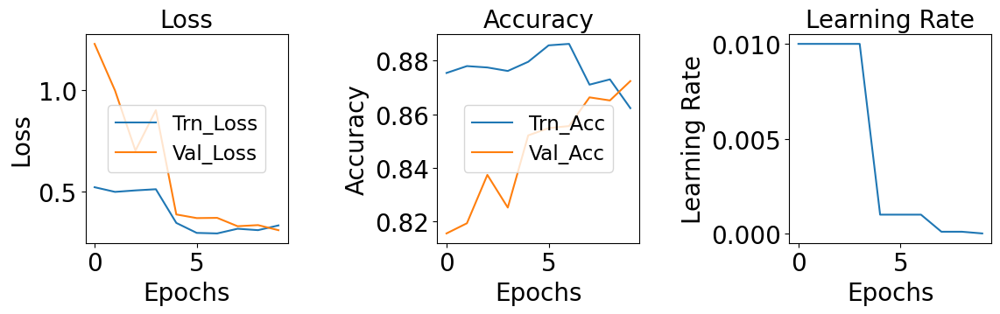

In [ ]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Plot the loss
axes[0].plot(history.history['loss'], label='Trn_Loss')
axes[0].plot(history.history['val_loss'], label='Val_Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss')
axes[0].legend(loc='center',fontsize='small') #loc='upper right',

# Plot the accuracy
axes[1].plot(history.history['accuracy'], label='Trn_Acc')
axes[1].plot(history.history['val_accuracy'], label='Val_Acc')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Accuracy')
axes[1].legend(loc='center',fontsize='small') #loc='lower right',

# Plot the learning rate
axes[2].plot(history.history['lr'])
axes[2].set_xlabel('Epochs')
axes[2].set_ylabel('Learning Rate')
axes[2].set_title('Learning Rate')

# Adjust the spacing between subplots
plt.tight_layout()

# Save and show the figure
plt.savefig(abspath_curr + '/result/figure/Learning_curve_Section2_vgg16_after_freezing_v0.pdf')
plt.show()

### Evaluate model(VGG16)

In [ ]:
# Load the saved model
model.load_weights(filepath=abspath_curr + '/result/model/model.vgg16_v0')
loss, accuracy = model.evaluate(test_dat_rs)

1301/1301 [==============================] - 28s 22ms/step - loss: 0.3176 - accuracy: 0.8686


#### Confusion matrix


In [ ]:
# Extract the features (X_test) and true labels (Y_true)
X_test = test_dat_rs.map(lambda x, y: x)  # Assuming the features are in the first column
Y_true = y_test_2  # Assuming the true labels are in the second column

# Predict the labels for the test set
Y_pred = model.predict(X_test)

# Convert the true and predicted labels to binary format
Y_true_binary = np.argmax(Y_true, axis=1)
Y_pred_binary = np.argmax(Y_pred, axis=1)

# Create the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

1301/1301 [==============================] - 25s 19ms/step


In [ ]:
# Compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true_binary, Y_pred_binary)

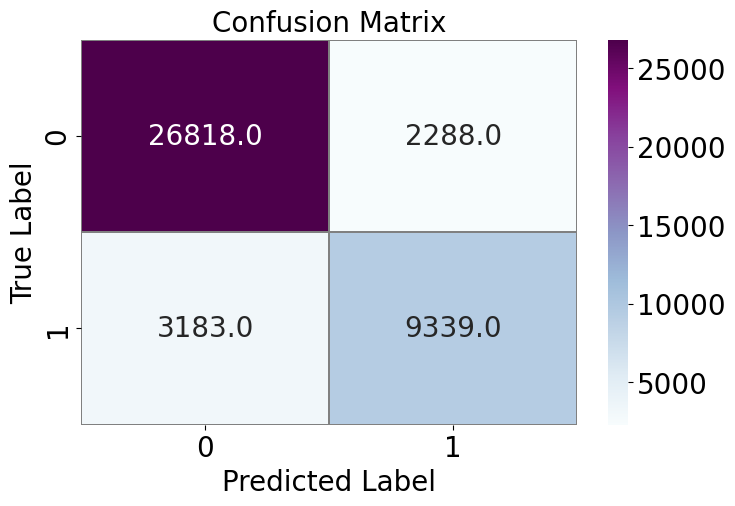

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

f, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="BuPu", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

***VGG16 with freezing pretrained layers showed 80.3% of real cancer prediction and 89.4% precision for determine healty units**

In [ ]:
26818/(26818+3183)

0.8939035365487817

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score
# Calculate accuracy
accuracy = accuracy_score(Y_true_binary, Y_pred_binary)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(Y_true_binary, Y_pred_binary)
print("Precision:", precision)

# Calculate recall
recall = recall_score(Y_true_binary, Y_pred_binary)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_true_binary, Y_pred_binary)
print(f'F1 score:,{f1}')

Accuracy: 0.8685740367060633
Precision: 0.8032166508987701
Recall: 0.7458073790129373
F1 score:,0.7734481759079052


# Ⅲ. Conclusions

## <font color='#ff1778'>Final model</font>

<u> Criterion </u>
 1. Compare the prediction power on the Test set: F1, Precision for Cancer and Healthy, etc
 2. Model Robustness: Accuracy gap between Train and Validation (whether overfitting)
 3. Model Complexity: Number of parameters, etc

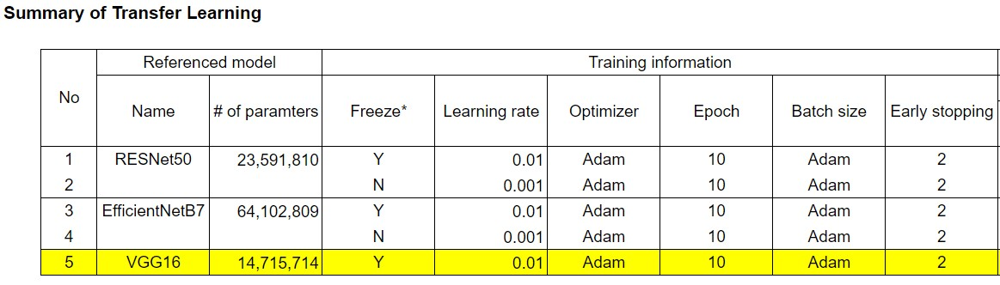

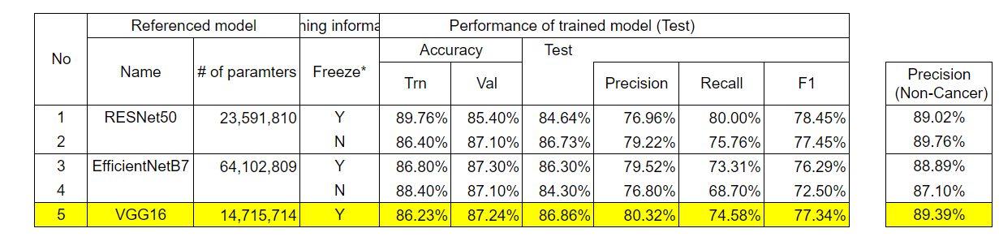

### <u> Summary of Final model  </u>

**VGG16 with freezing pretrained layers have chosen as Final model.**

1. The test score predicting Cancer tissues was the highest out of all models.
 ​
2. While the F1 score did not out-perform the score of the RESNet, the recall and the precision were still out-performing that of the RESNet. ​

3. Model Robustness: The gap between the training and validation tests were smaller with VGG16 than in RESNet meaning VGG16 has more consistent performance. ​

4. Model Complexity: VGG16 is the least complex with having less parameters to train



## <u> Lesson  </u>

1. In terms of Preprocessing, **oversamplling for mitigate class imbalance might not positive effect for this topic, so we used original train data.**
  * When we trained using oversampled train set (Cancer and Healthy class got balanced), recall for cancer was about 100%, meaning model covered all cancer cases of test set.
 - But **there were also many misclassfications that predicted healty pixcels as cancer (precision for non-cancer dramatically dropped), which made poor accuracy.**



2. Data engineering issue
  * In terms of training model, heavy models like efficientNet took much time to fit, which implies we should also be careful when it comes to applying complex model





# Reference

1. [Kaggle Topic & Data](https://www.kaggle.com/datasets/paultimothymooney/breast-histopathology-images)

2. [Data preprocessing(Kaggle case)](https://www.kaggle.com/code/sivaranjanisamy/siv-breast-cancer-detection/)

3. [ResNet, EfficientNet](https://medium.com/@enrico.randellini/image-classification-resnet-vs-efficientnet-vs-efficientnet-v2-vs-compact-convolutional-c205838bbf49)

4. [VGG16](https://medium.com/towards-data-science/step-by-step-vgg16-implementation-in-keras-for-beginners-a833c686ae6c)